In [1]:
import os
import sys
import time
import tqdm

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.signal import hilbert, chirp

from utils import *

In [2]:
DATA_PATH = '../dataset'
files = os.listdir(DATA_PATH)
data = [pd.read_csv(os.path.join(DATA_PATH, files[i])) for i in range(len(files)) if files[i].endswith('csv')]
metadata = pd.read_excel(os.path.join(DATA_PATH, 'MetaData.xlsx'))

### 데이터 유효성 확인 - 중복

In [3]:
for i in range(len(files)-1):
    for j in range(i+1, len(files)-1):
        result = set(data[i].MeasureId.value_counts().sort_index().index) & set(data[j].MeasureId.value_counts().sort_index().index)
        if len(result) != 0:
            print(f'{i}/{j}: {len(result)} intersections - {result}')
            # 확인해봤는데, 실제 데이터도 다 겹침..... 이게 무슨 일인가? 

0/2: 32 intersections - {3997, 3998, 3999, 591, 592, 593, 597, 598, 599, 600, 601, 602, 603, 604, 605, 606, 607, 608, 609, 610, 611, 612, 613, 614, 615, 616, 617, 618, 619, 620, 1786, 1787}
0/3: 33 intersections - {1801, 1803, 1842, 955, 956, 957, 961, 962, 963, 964, 965, 966, 967, 968, 969, 970, 971, 972, 973, 974, 975, 976, 977, 978, 979, 980, 4044, 4047, 984, 985, 986, 4042, 4043}
0/4: 36 intersections - {4101, 4102, 4103, 2483, 2484, 2485, 2486, 2487, 2488, 2489, 2491, 2492, 4157, 2493, 2494, 2496, 2497, 2495, 2499, 2500, 2501, 4158, 2507, 2508, 2509, 2510, 2515, 2516, 2517, 2523, 2524, 2525, 2531, 2532, 2533, 2534}


### 데이터 전처리 및 시각화

In [4]:
df = pd.concat([data[i] for i in range(len(data))]).drop_duplicates()
fault_detected = [378, 381, 382, 386, 387, 389, 420, 591, 592, 593, 1113, 2489, 2497]
fault_not_detected = set(df.MeasureId.value_counts().index)- set(fault_detected)
df_TP = df.query(f"MeasureId in {fault_detected}")
df_FN = df.query(f"MeasureId not in {fault_detected}")

In [5]:
print(f'메타데이터의 Mesaure Id 수: {df.MeasureId.value_counts().shape[0]}')
print(f'CMS데이터의 Mesaure Id 수: {metadata.MeasureId.value_counts().shape[0]}', end='\n\n')
print(f'메타데이터에만 있는 Measure Id: {len(set(metadata.MeasureId) - set(df.MeasureId.value_counts().index))}')
print(f'CMS데이터에만 있는 Measure Id: {len(set(df.MeasureId.value_counts().index) - set(metadata.MeasureId))}')

메타데이터의 Mesaure Id 수: 166
CMS데이터의 Mesaure Id 수: 149

메타데이터에만 있는 Measure Id: 14
CMS데이터에만 있는 Measure Id: 31


(2000.0, 4000.0)

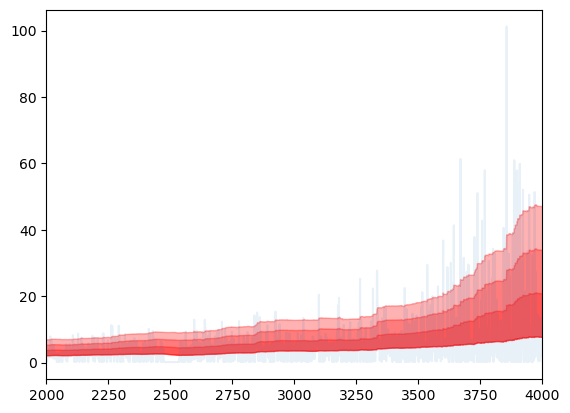

In [6]:
from statsmodels.tsa.seasonal import seasonal_decompose
df_387 = df_TP[df_TP.MeasureId==387][8000:]
df_387['ma48']=df_387.Scalar.ewm(48).mean()
df_387['std48']=df_387.Scalar.rolling(48).std()
df_387['ma336']=df_387.Scalar.ewm(336).mean()
df_387['std336']=df_387.Scalar.rolling(336).std()
df_387=df_387.dropna(axis=0).reset_index(drop=True)
plt.fill_between(df_387.index, df_387.ma336, df_387.ma336+df_387.std336, color='red', alpha=0.3)
plt.fill_between(df_387.index, df_387.ma336, df_387.ma336+df_387.std336*2, color='red', alpha=0.3)
plt.fill_between(df_387.index, df_387.ma336, df_387.ma336+df_387.std336*3, color='red', alpha=0.3)
df_387.Scalar.plot(alpha=0.1)
plt.xlim([2000,4000])

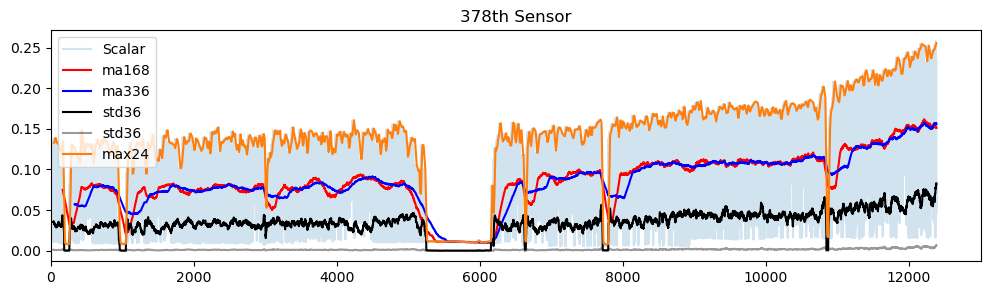

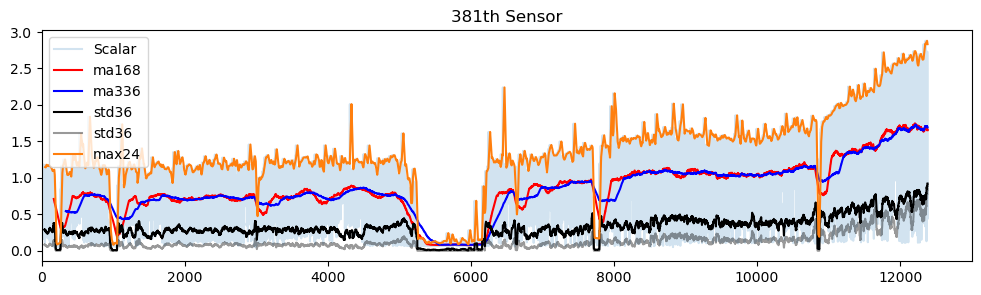

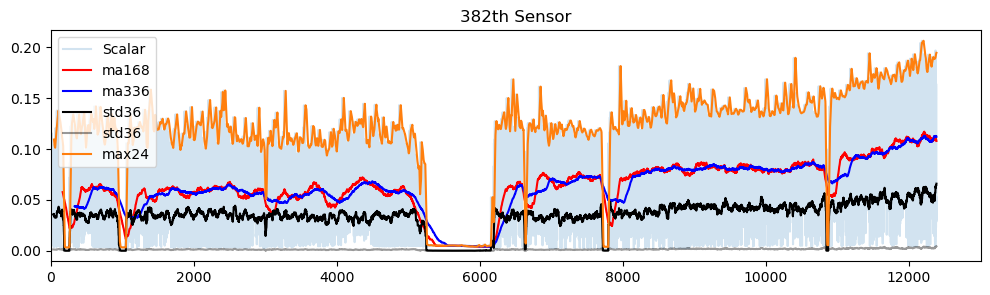

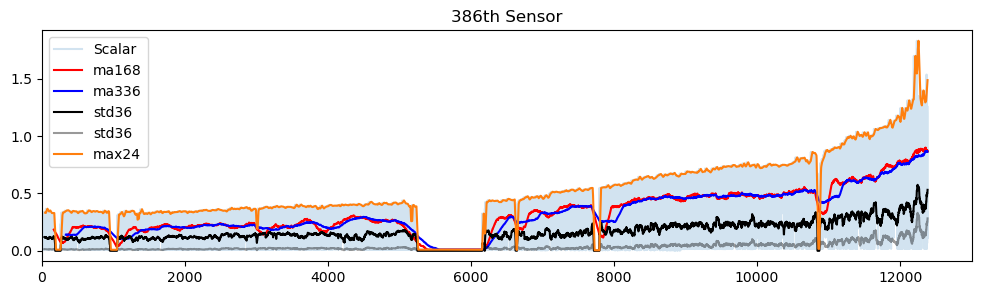

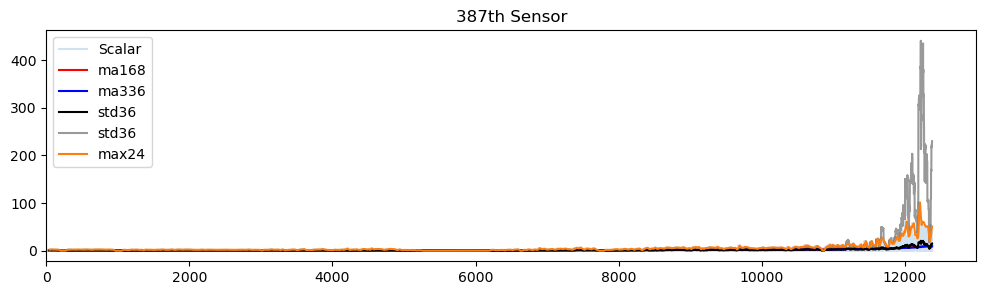

...

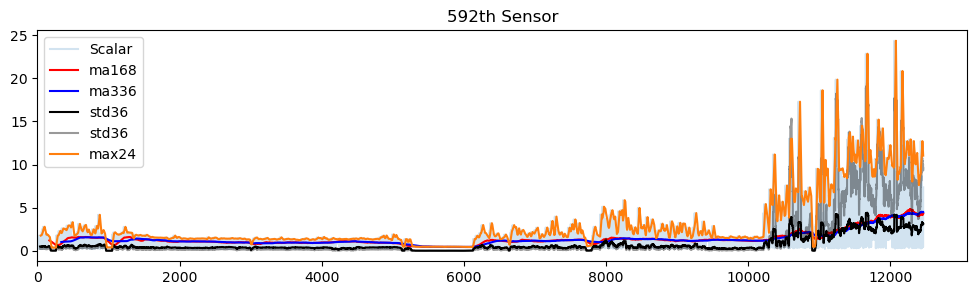

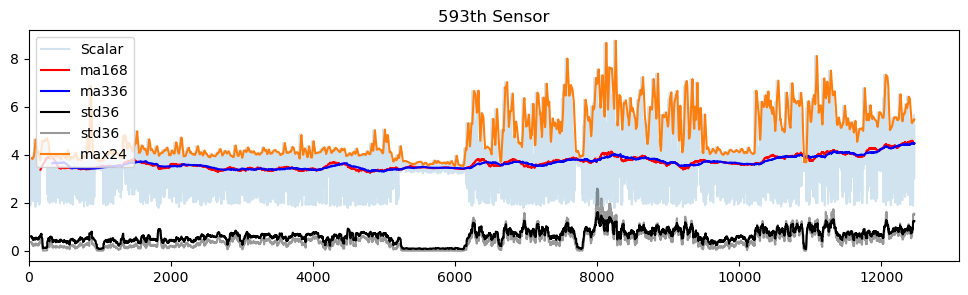

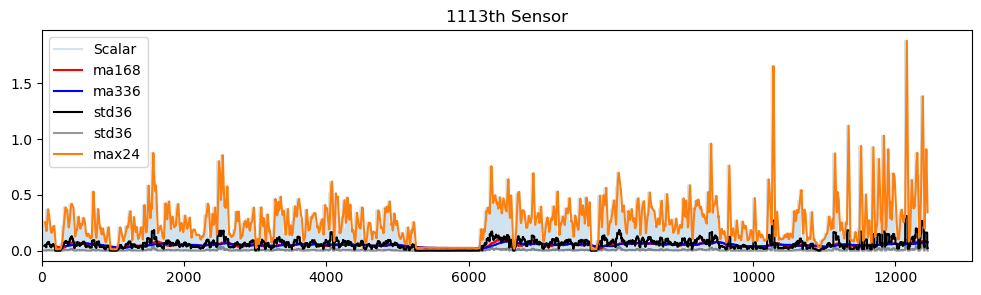

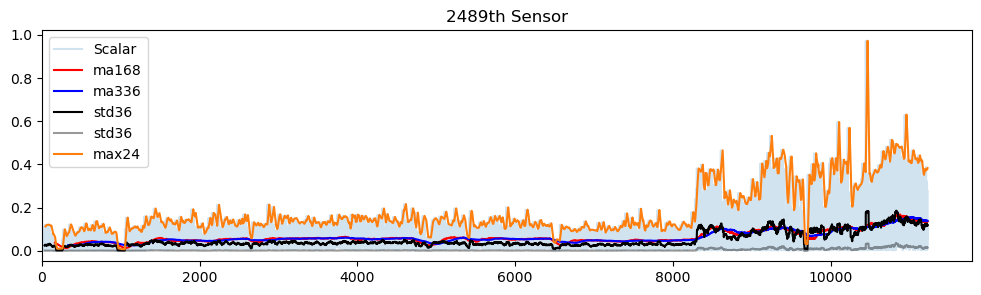

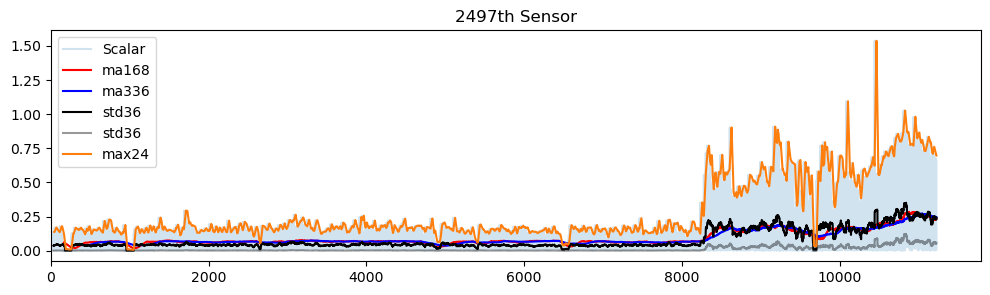

In [8]:
for measure_id in fault_detected:
    visualize_MA_with_std(df=df, window_size=[168, 336], measure_id=measure_id, std_window=36, envelope_window=24)
    

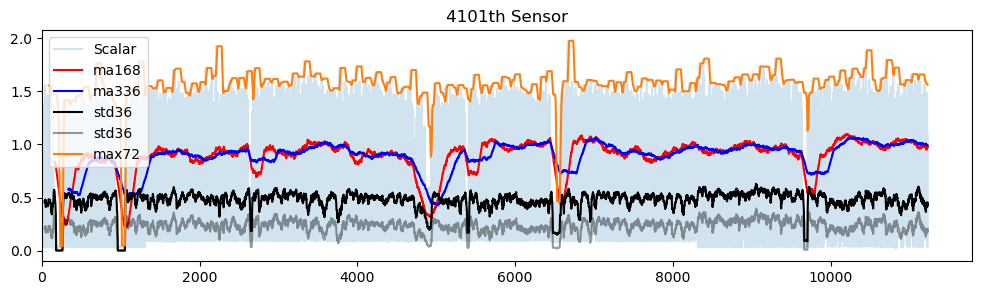

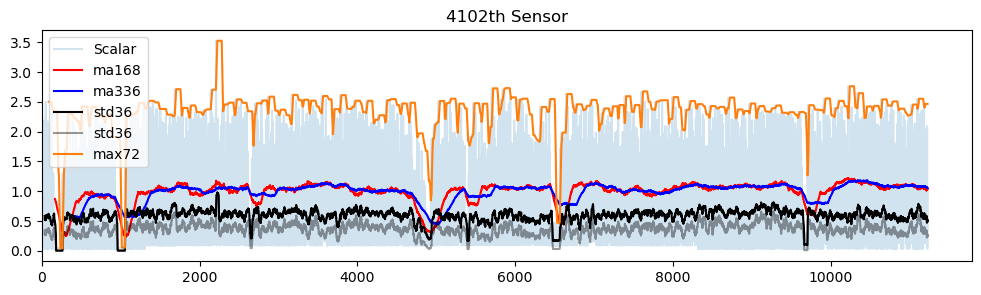

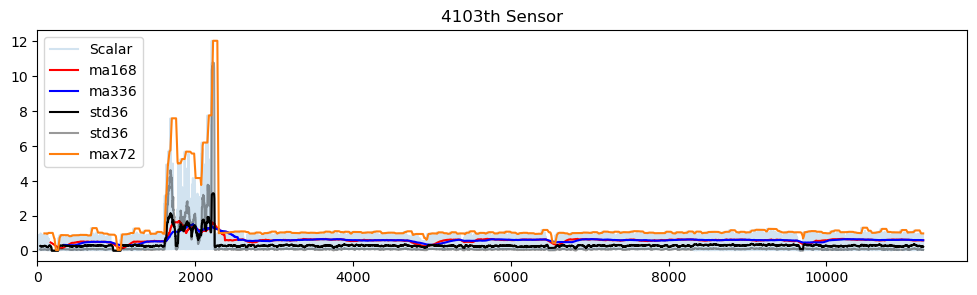

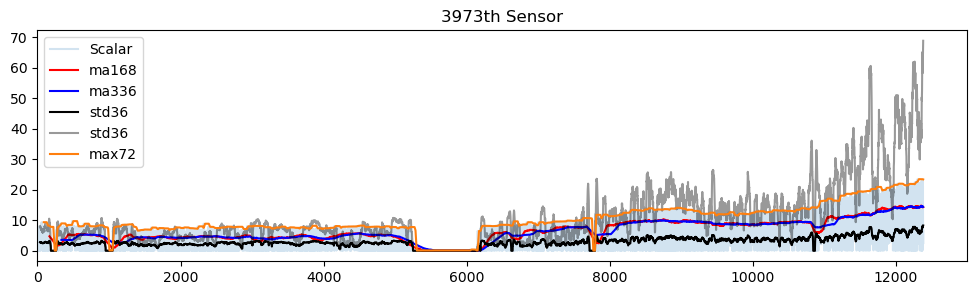

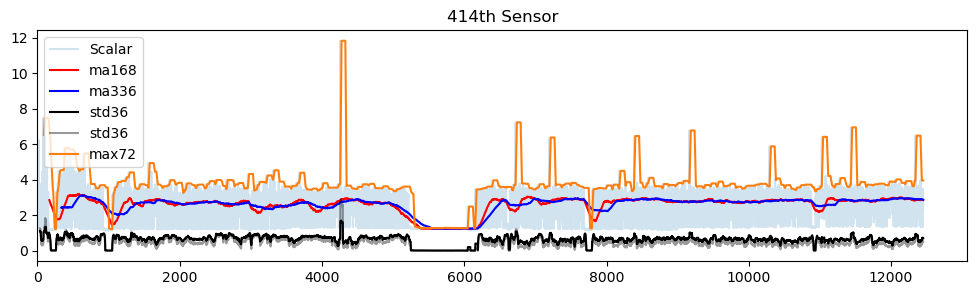

...

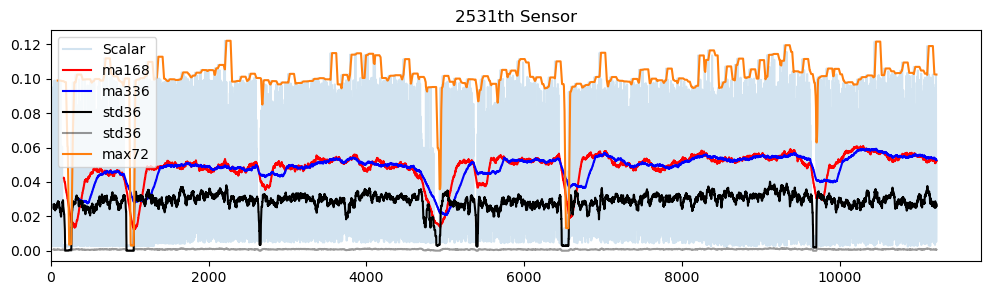

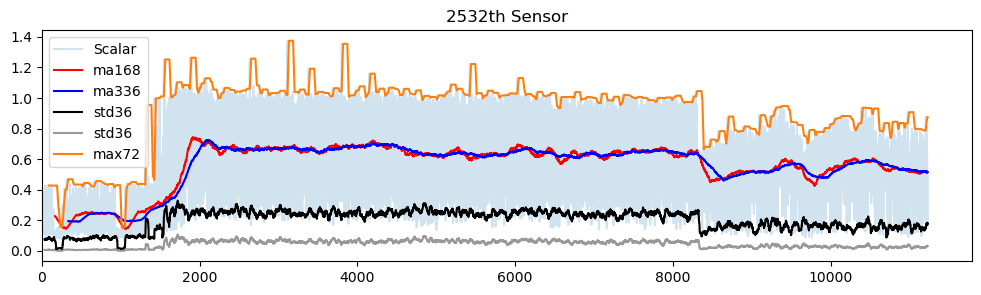

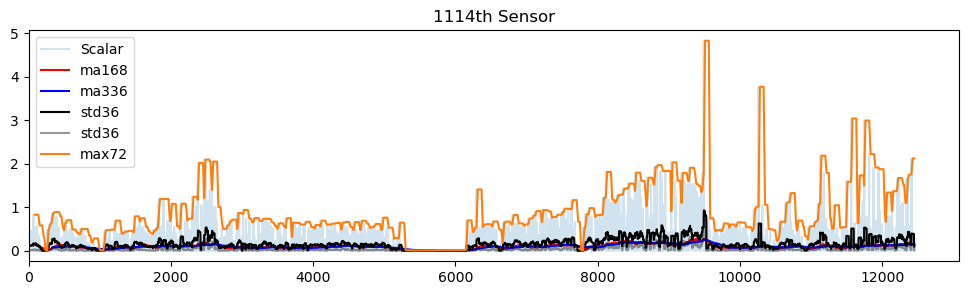

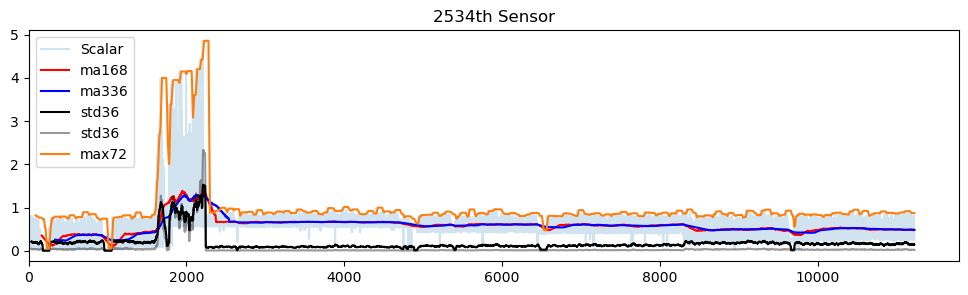

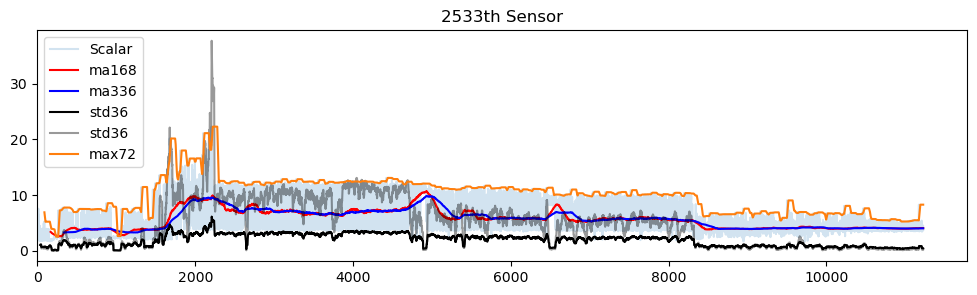

In [65]:
visualize_MA_with_std(df=df, window_size=[168, 336], measure_id_list=fault_not_detected, std_window=36, envelope_window=72)

## 전처리기 테스트

<AxesSubplot:>

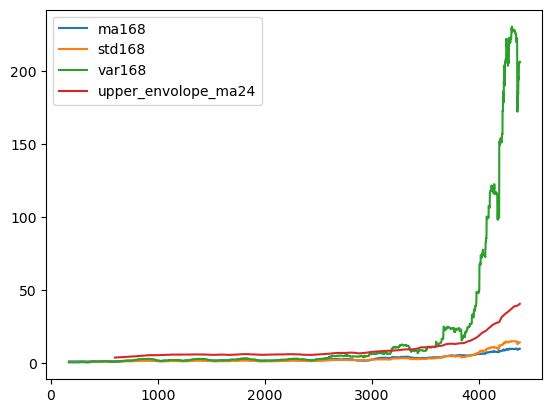

In [157]:
df_387 = df_TP[df_TP.MeasureId==387][8000:].reset_index()
preprocessed_df = rolling_processor(df_387, window_size=168, std_window=168, envelope_window=24)
preprocessed_df.iloc[:,4:].plot()

<AxesSubplot:>

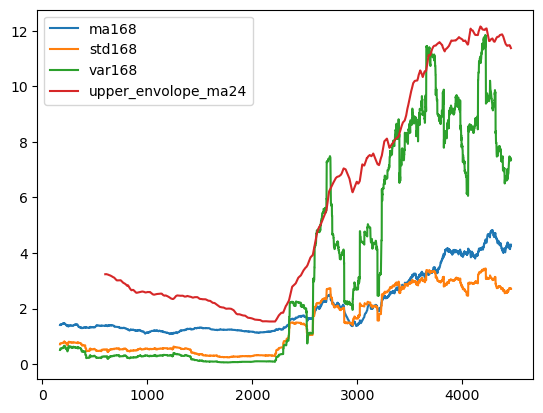

In [158]:
df_592 = df_TP[df_TP.MeasureId==592][8000:].reset_index()
preprocessed_df = rolling_processor(df_592, window_size=168, std_window=168, envelope_window=24)
preprocessed_df.iloc[:,4:].plot()